In [3]:
import pandas as pd
import numpy as np
import os
import struct
from scipy.io import wavfile as wav
import IPython.display as ipd
from IPython.display import Image
import librosa
import librosa.display
from librosa.display import waveshow, specshow
import matplotlib.pyplot as plt
from matplotlib.pyplot import specgram
%matplotlib inline

In [4]:
import pandas as pd
dataset = pd.read_csv('C:/Users/ishaa/OneDrive/Desktop/dataset/UrbanSound8K.csv')
audio_dataset_path='dataset/audio/'
print(dataset.shape)
dataset.head(10) 

(8732, 8)


,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.000000,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.500000,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.500000,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.000000,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.500000,72.500000,1,5,2,children_playing
5,100263-2-0-143.wav,100263,71.500000,75.500000,1,5,2,children_playing
6,100263-2-0-161.wav,100263,80.500000,84.500000,1,5,2,children_playing
7,100263-2-0-3.wav,100263,1.500000,5.500000,1,5,2,children_playing
8,100263-2-0-36.wav,100263,18.000000,22.000000,1,5,2,children_playing
9,100648-1-0-0.wav,100648,4.823402,5.471927,2,10,1,car_horn


In [5]:
dataset.isnull().sum()

slice_file_name    0
fsID               0
start              0
end                0
salience           0
fold               0
classID            0
class              0
dtype: int64

In [6]:
### Check whether the dataset is imbalanced
dataset['class'].value_counts()

dog_bark            1000
children_playing    1000
air_conditioner     1000
street_music        1000
engine_idling       1000
jackhammer          1000
drilling            1000
siren                929
car_horn             429
gun_shot             374
Name: class, dtype: int64

The meta-data contains 8 columns. slice_file_name: name of the audio file fsID: FreesoundID of the recording where the excerpt is taken from start: start time of the slice end: end time of the slice salience: salience rating of the sound. 1 = foreground, 2 = background fold: The fold number (1-10) to which this file has been allocated classID: 0 = air_conditioner 1 = car_horn 2 = children_playing 3 = dog_bark 4 = drilling 5 = engine_idling 6 = gun_shot 7 = jackhammer 8 = siren 9 = street_music class: class name

In [7]:
classes = np.unique(dataset['classID'])
classes_names = np.unique(dataset['class'])
print(classes)
print(classes_names)

[0 1 2 3 4 5 6 7 8 9]
['air_conditioner' 'car_horn' 'children_playing' 'dog_bark' 'drilling'
 'engine_idling' 'gun_shot' 'jackhammer' 'siren' 'street_music']


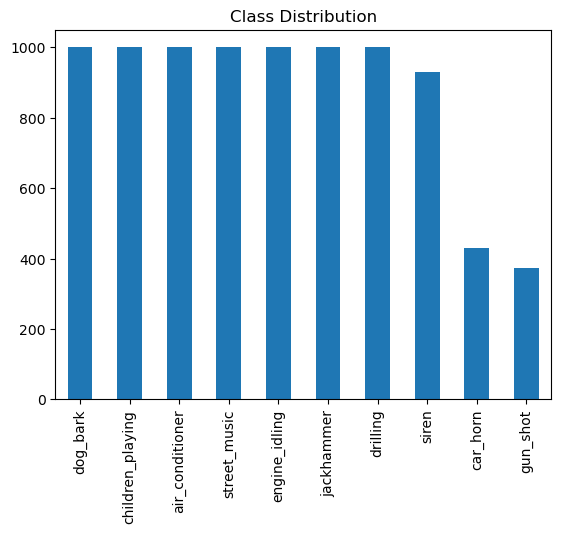

In [9]:
dataset["class"].value_counts().plot(kind = 'bar')
plt.title('Class Distribution')
plt.show()

In [8]:
#Class Balancing
classid = []
print("Class balancing\n")
nclass = np.zeros(10)
for i in range(10):
  class_n = dataset.loc[dataset['classID'] == i]
  nclass[i] = class_n.shape[0]
  print("Class{num}".format(num=i),"has",class_n.shape[0], "samples", classes_names[i])

print("\n")

Class balancing

Class0 has 1000 samples air_conditioner
Class1 has 429 samples car_horn
Class2 has 1000 samples children_playing
Class3 has 1000 samples dog_bark
Class4 has 1000 samples drilling
Class5 has 1000 samples engine_idling
Class6 has 374 samples gun_shot
Class7 has 1000 samples jackhammer
Class8 has 929 samples siren
Class9 has 1000 samples street_music




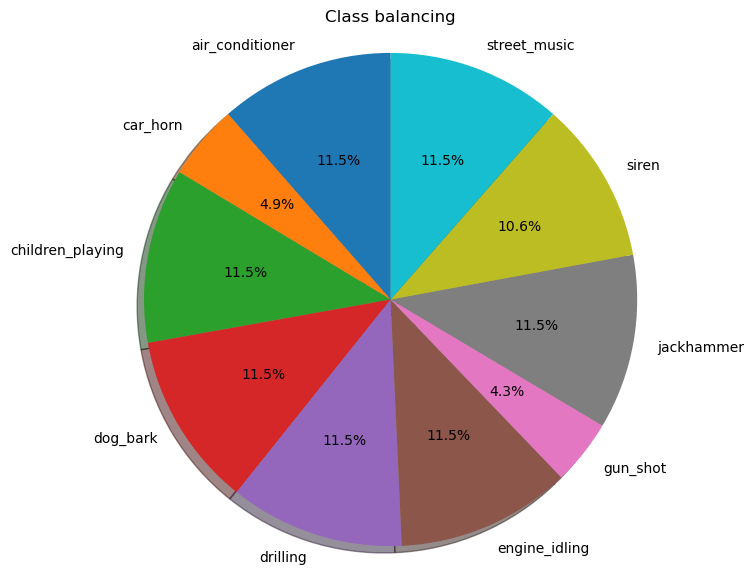

In [11]:
#Pie Chart On classes
fig, ax = plt.subplots()
fig.set_figheight(7)
fig.set_figwidth(7)
ax.pie(nclass, labels=classes_names, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax.axis('equal')  
ax.set(title='Class balancing')
plt.show()

In [9]:
#Folder Balancing
nfolder = np.zeros(10)
print("Folder balancing\n")
for i in range(10):
  folder_n = dataset.loc[dataset['fold'] == i+1]
  nfolder[i] = folder_n.shape[0]
  print("Folder{num}".format(num=i+1),"has",folder_n.shape[0], "samples")

Folder balancing

Folder1 has 873 samples
Folder2 has 888 samples
Folder3 has 925 samples
Folder4 has 990 samples
Folder5 has 936 samples
Folder6 has 823 samples
Folder7 has 838 samples
Folder8 has 806 samples
Folder9 has 816 samples
Folder10 has 837 samples


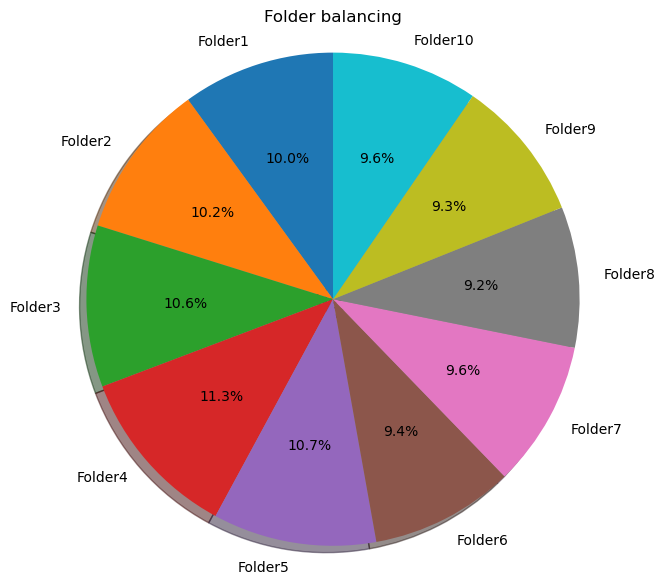

In [10]:
#Pie Chart on Folders
fig, ax = plt.subplots()
fig.set_figheight(7)
fig.set_figwidth(7)
folder_names = ["Folder{num}".format(num=i+1) for i in range(10)]
ax.pie(nfolder, labels=folder_names, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax.axis('equal')  
ax.set(title='Folder balancing')

plt.show()

Different Sound Understanding

Dog_Bark

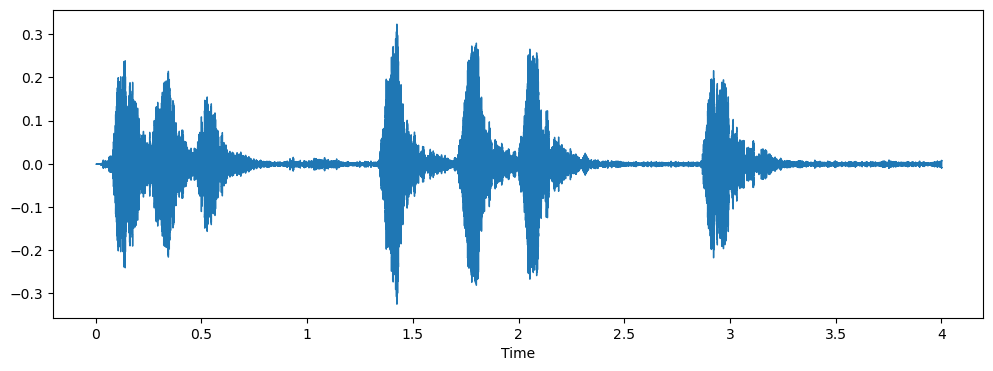

In [11]:
df="C:/Users/ishaa/OneDrive/Desktop/dataset/Audio/fold1/7383-3-0-0.wav"
plt.figure(figsize=(12,4))
data,sample_rate=librosa.load(df)
librosa.display.waveshow(data,sr=sample_rate)
ipd.Audio(df)

Children Playing

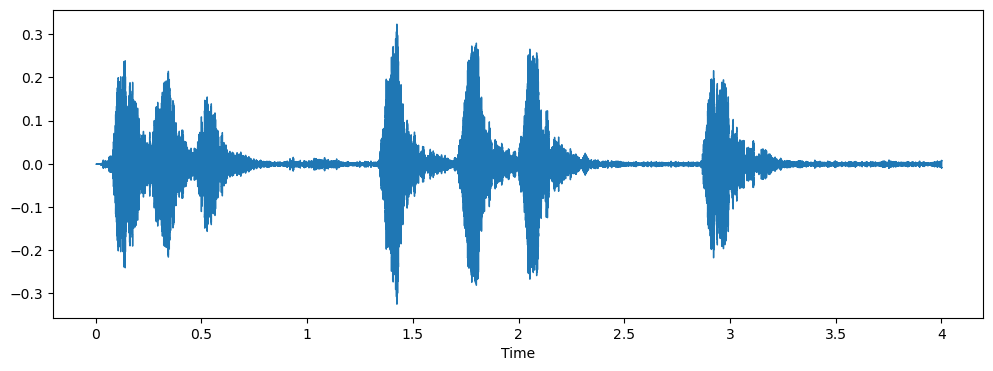

In [12]:
df1="C:/Users/ishaa/OneDrive/Desktop/dataset/Audio/fold1/15564-2-0-1.wav"
plt.figure(figsize=(12,4))
data,sample_rate=librosa.load(df)
librosa.display.waveshow(data,sr=sample_rate)
ipd.Audio(df)

Drilling

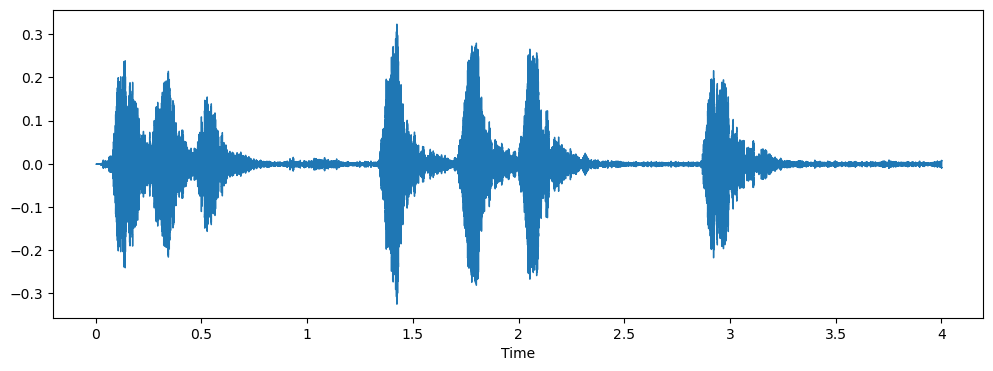

In [13]:
df2="C:/Users/ishaa/OneDrive/Desktop/dataset/Audio/fold1/46669-4-0-2.wav"
plt.figure(figsize=(12,4))
data,sample_rate=librosa.load(df)
librosa.display.waveshow(data,sr=sample_rate)
ipd.Audio(df)

In [15]:
data_description = []
for i in range(1,11):
    data_description.append(dataset[dataset.fold == i]['class'].value_counts())
    
data_description = pd.DataFrame(data_description)
data_description['folder'] = ["fold"+str(x) for x in range(1,11)]
data_description.reset_index(inplace = True)
data_description

,index,jackhammer,dog_bark,children_playing,street_music,air_conditioner,drilling,engine_idling,siren,car_horn,gun_shot,folder
0,class,120,100,100,100,100,100,96,86,36,35,fold1
1,class,120,100,100,100,100,100,100,91,42,35,fold2
2,class,120,100,100,100,100,100,107,119,43,36,fold3
3,class,120,100,100,100,100,100,107,166,59,38,fold4
4,class,120,100,100,100,100,100,107,71,98,40,fold5
5,class,68,100,100,100,100,100,107,74,28,46,fold6
6,class,76,100,100,100,100,100,106,77,28,51,fold7
7,class,78,100,100,100,100,100,88,80,30,30,fold8
8,class,82,100,100,100,100,100,89,82,32,31,fold9
9,class,96,100,100,100,100,100,93,83,33,32,fold10


In [16]:
data = dataset
def path_class(filename):
    excerpt = data[data['slice_file_name'] == filename]
    path_name = os.path.join('C:/Users/ishaa/OneDrive/Desktop/dataset/Audio/', 'fold'+str(excerpt.fold.values[0]), filename)
    return path_name, excerpt['class'].values[0]
  
def wav_fmt_parser(file_name):
    full_path, _ = path_class(file_name)
    wave_file = open(full_path,"rb")
    riff_fmt = wave_file.read(36)
    n_channels_string = riff_fmt[22:24]
    n_channels = struct.unpack("H",n_channels_string)[0]
    s_rate_string = riff_fmt[24:28]
    s_rate = struct.unpack("I",s_rate_string)[0]
    bit_depth_string = riff_fmt[-2:]
    bit_depth = struct.unpack("H",bit_depth_string)[0]
    return (n_channels,s_rate,bit_depth)

In [17]:
wav_fmt_data = [wav_fmt_parser(i) for i in data.slice_file_name]
data[['n_channels','sampling_rate','bit_depth']] = pd.DataFrame(wav_fmt_data)
data.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class,n_channels,sampling_rate,bit_depth
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark,2,44100,16
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing,2,44100,16
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing,2,44100,16
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing,2,44100,16
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing,2,44100,16


In [18]:
print("sample rate  \n", data.sampling_rate.value_counts())
print("\n Number of channels \n", data.n_channels.value_counts())
print("\n Bit_depth \n", data.bit_depth.value_counts())

sample rate  
 44100     5370
48000     2502
96000      610
24000       82
16000       45
22050       44
11025       39
192000      17
8000        12
11024        7
32000        4
Name: sampling_rate, dtype: int64

 Number of channels 
 2    7993
1     739
Name: n_channels, dtype: int64

 Bit_depth 
 16    5758
24    2753
32     169
8       43
4        9
Name: bit_depth, dtype: int64


Here Librosa converts the signal to mono, meaning the channel will be 1

In [20]:
librosa_load, librosa_sampling_rate= librosa.load('C:/Users/ishaa/OneDrive/Desktop/dataset/Audio/fold1/46669-4-0-2.wav')
scipy_sampling_rate, scipy_load = wav.read('C:/Users/ishaa/OneDrive/Desktop/dataset/Audio/fold1/46669-4-0-2.wav')
print('original wav file min - max range:',np.min(scipy_load),'-',np.max(scipy_load))
print('converted wav file min - max range:',np.min(librosa_load),'-',np.max(librosa_load))
print('\n')
print('original sample rate:',scipy_sampling_rate)
print('converted sample rate:',librosa_sampling_rate)

original wav file min - max range: -17867 - 16681
converted wav file min - max range: -0.2937788 - 0.28226689


original sample rate: 48000
converted sample rate: 22050


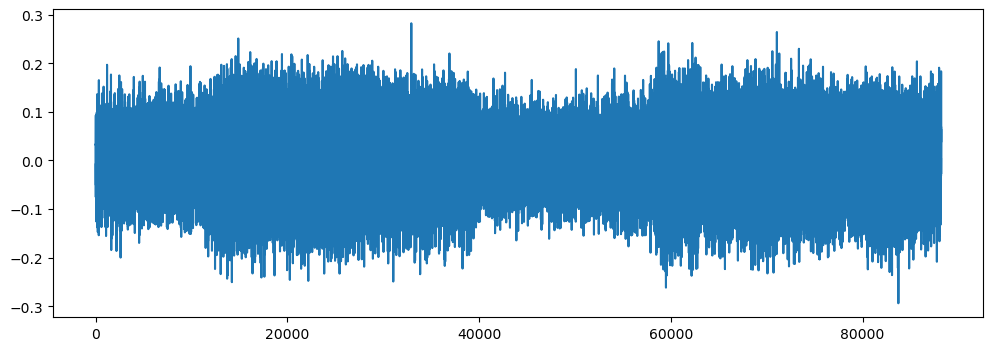

In [21]:
### Lets plot the librosa audio data
# Original audio with 1 channel 
plt.figure(figsize=(12, 4))
plt.plot(librosa_load)

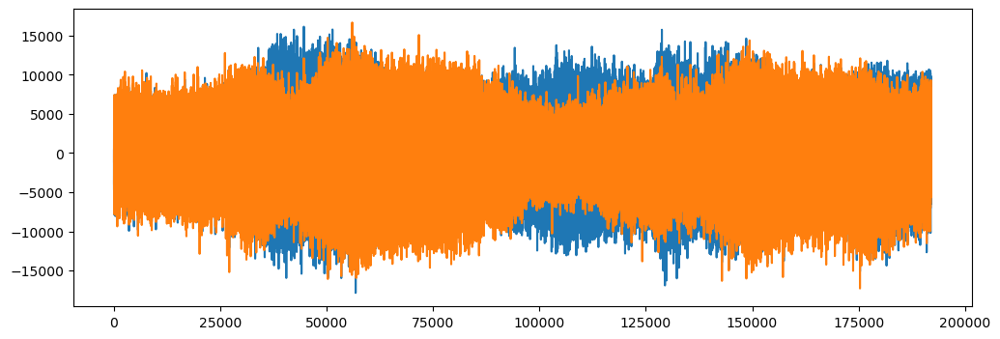

In [22]:
# Original audio with 2 channels 
plt.figure(figsize=(12, 4))
plt.plot(scipy_load)

In [26]:
import pandas as pd
import numpy as np
import os
import struct
from scipy.io import wavfile as wav
import IPython.display as ipd
from IPython.display import Image
import librosa
import librosa.display
from librosa.display import waveshow, specshow
import matplotlib.pyplot as plt
from matplotlib.pyplot import specgram
%matplotlib inline

def load_sound_files(file_paths):
    raw_sounds = []
    for fp in file_paths:
        X,sr = librosa.load('C:/Users/ishaa/OneDrive/Desktop/dataset/Audio/fold1/' + fp)
        raw_sounds.append(X)
    return raw_sounds

def plot_waves(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,60))
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        librosa.display.waveshow(np.array(f),sr=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle("Figure 1: Waveshow",x=0.5, y=0.915,fontsize=18)
    plt.show()
from matplotlib.colors import Normalize
def plot_mfcc(sound_names,raw_sounds):
    i = 1
    hop_length=512
    fig = plt.figure(figsize=(10,4))
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        mfcc=librosa.feature.mfcc(np.array(f), sr=22050,n_mfcc=40)
        librosa.display.specshow(mfcc, x_axis='time',norm=Normalize(vmin=-30,vmax=30))
        plt.title(n.title())
        i += 1
    plt.show()
def plot_specgram(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,60))
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        specgram(np.array(f), Fs=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle("Figure 2: Spectrogram",x=0.5, y=0.915,fontsize=18)
    plt.show()


In [32]:
def plot_mfcc(sound_names, raw_sounds):
    plt.figure(figsize=(12, 6))
    for i, sound in enumerate(raw_sounds):
        mfccs = librosa.feature.mfcc(y=sound, sr=sample_rate, n_mfcc=13)
        plt.subplot(2, len(raw_sounds) // 2, i + 1)
        plt.title(sound_names[i])
        plt.xlabel('Time')
        plt.ylabel('MFCC')
        librosa.display.specshow(mfccs, x_axis='time')
        plt.colorbar()
    plt.tight_layout()
    plt.show()

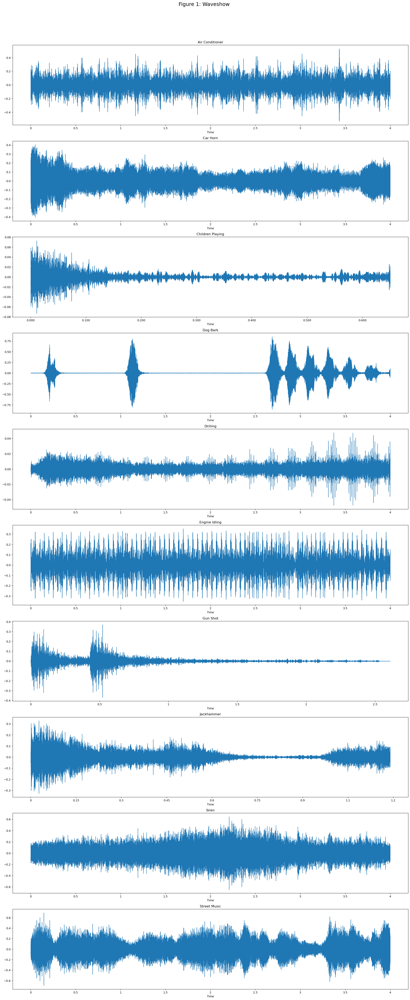

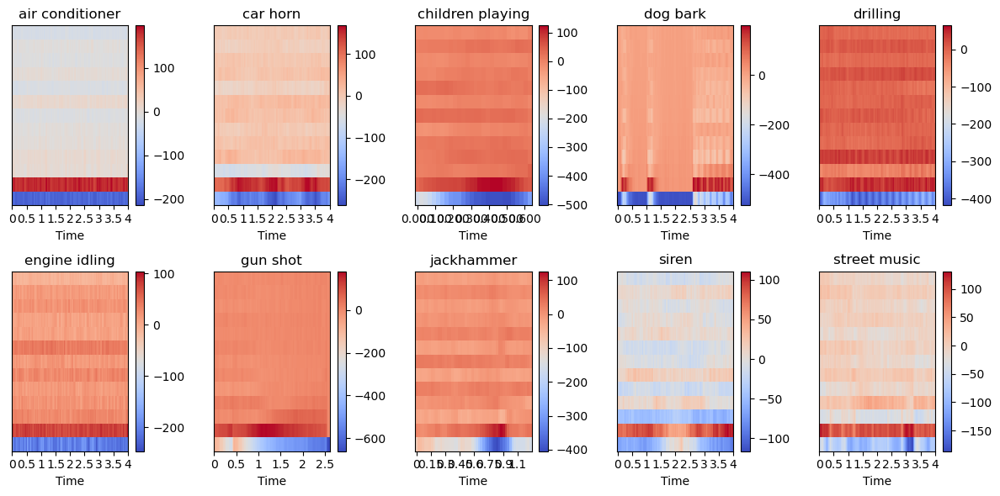

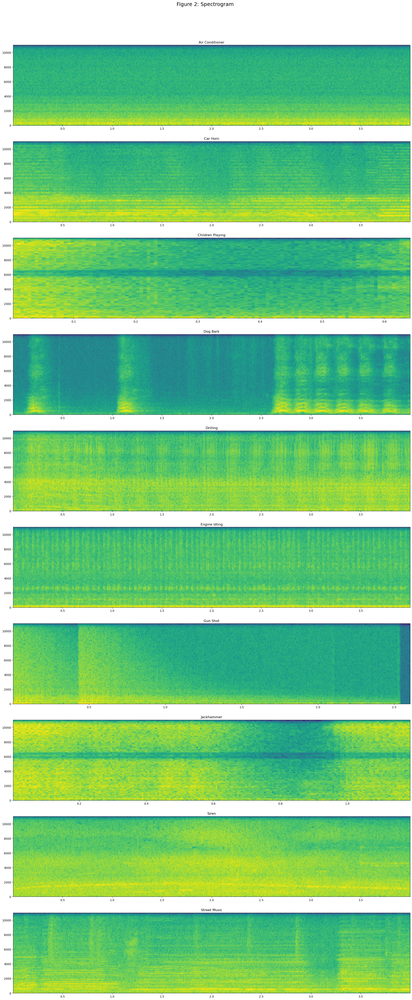

In [33]:
sound_file_paths = ["134717-0-0-0.wav","24074-1-0-3.wav","147764-4-2-0.wav","101415-3-0-2.wav",
"14113-4-0-0.wav","146186-5-0-10.wav","102305-6-0-0.wav",
"147764-4-7-0.wav","106905-8-0-0.wav","108041-9-0-2.wav"]

sound_names = ["air conditioner","car horn","children playing",
"dog bark","drilling","engine idling", "gun shot",
"jackhammer","siren","street music"]

raw_sounds = load_sound_files(sound_file_paths)
plot_waves(sound_names,raw_sounds)
plot_mfcc(sound_names,raw_sounds)
plot_specgram(sound_names,raw_sounds)

chroma features

In [34]:
def plot_chromagram_stft(sound_names,raw_sounds):
    i = 1
    hop_length=512
    fig = plt.figure(figsize=(25,60))
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        chr=librosa.feature.chroma_stft(np.array(f), sr=22050, hop_length= hop_length)
        librosa.display.specshow(chr, x_axis='time', y_axis='chroma', hop_length= hop_length, cmap='coolwarm')
        plt.title(n.title())
        i += 1
    plt.suptitle("Figure 3: chromagram",x=0.5, y=0.915,fontsize=18)
    plt.show()
    
def plot_chromagram_cqt(sound_names,raw_sounds):
    i = 1
    hop_length=512
    fig = plt.figure(figsize=(25,60))
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        chrq=librosa.feature.chroma_cqt(np.array(f), sr=22050, hop_length= hop_length)
        librosa.display.specshow(chrq, x_axis='time', y_axis='chroma', hop_length= hop_length, cmap='coolwarm')
        plt.title(n.title())
        i += 1
    plt.suptitle("Figure 3: chromagram",x=0.5, y=0.915,fontsize=18)
    plt.show()
def plot_chromagram_cens(sound_names,raw_sounds):
    i = 1
    hop_length=512
    fig = plt.figure(figsize=(25,60))
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        chrcn=librosa.feature.chroma_cens(np.array(f), sr=22050, hop_length= hop_length)
        librosa.display.specshow(chrcn, x_axis='time', y_axis='chroma', hop_length= hop_length, cmap='coolwarm')
        plt.title(n.title())
        i += 1
    plt.suptitle("Figure 3: chromagram",x=0.5, y=0.915,fontsize=18)
    plt.show()

In [38]:
def plot_chromagram_stft(sound_names, raw_sounds):
    plt.figure(figsize=(12, 6))
    for i, sound in enumerate(raw_sounds):
        chromagram = librosa.feature.chroma_stft(y=sound, sr=sample_rate)
        plt.subplot(2, len(raw_sounds) // 2, i + 1)
        plt.title(sound_names[i])
        plt.xlabel('Time')
        plt.ylabel('Chromagram')
        librosa.display.specshow(chromagram, x_axis='time')
        plt.colorbar()
    plt.tight_layout()
    plt.show()

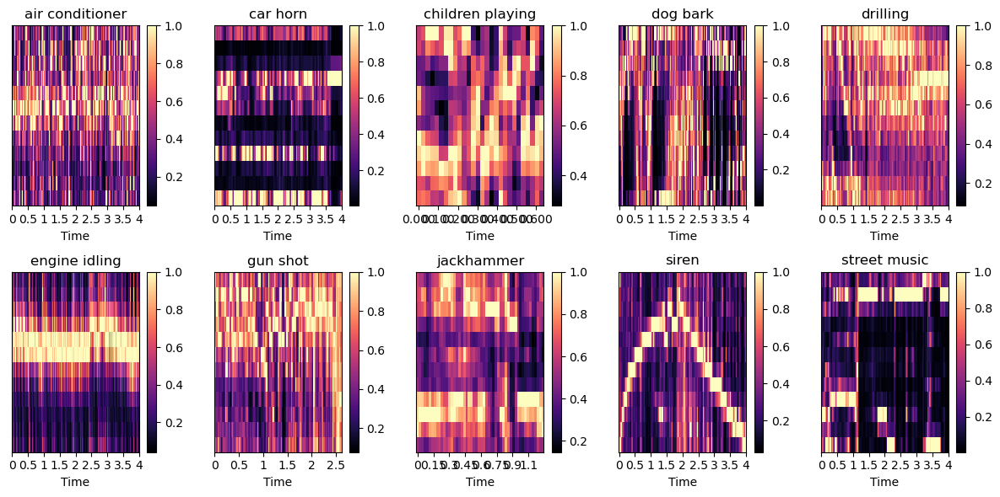

In [39]:
plot_chromagram_stft(sound_names,raw_sounds)

In [41]:
def plot_chromagram_cqt(sound_names, raw_sounds):
    plt.figure(figsize=(12, 6))
    for i, sound in enumerate(raw_sounds):
        chromagram = librosa.feature.chroma_cqt(y=sound, sr=sample_rate)
        plt.subplot(2, len(raw_sounds) // 2, i + 1)
        plt.title(sound_names[i])
        plt.xlabel('Time')
        plt.ylabel('Chromagram (CQT)')
        librosa.display.specshow(chromagram, x_axis='time')
        plt.colorbar()
    plt.tight_layout()
    plt.show()

c:\Users\ishaa\anaconda\Lib\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=1024 is too large for input signal of length=896
  warnings.warn(
c:\Users\ishaa\anaconda\Lib\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=1024 is too large for input signal of length=448
  warnings.warn(
c:\Users\ishaa\anaconda\Lib\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=1024 is too large for input signal of length=224
  warnings.warn(
c:\Users\ishaa\anaconda\Lib\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=1024 is too large for input signal of length=900
  warnings.warn(
c:\Users\ishaa\anaconda\Lib\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=1024 is too large for input signal of length=820
  warnings.warn(
c:\Users\ishaa\anaconda\Lib\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=1024 is too large for input signal of length=410
  warnings.warn(


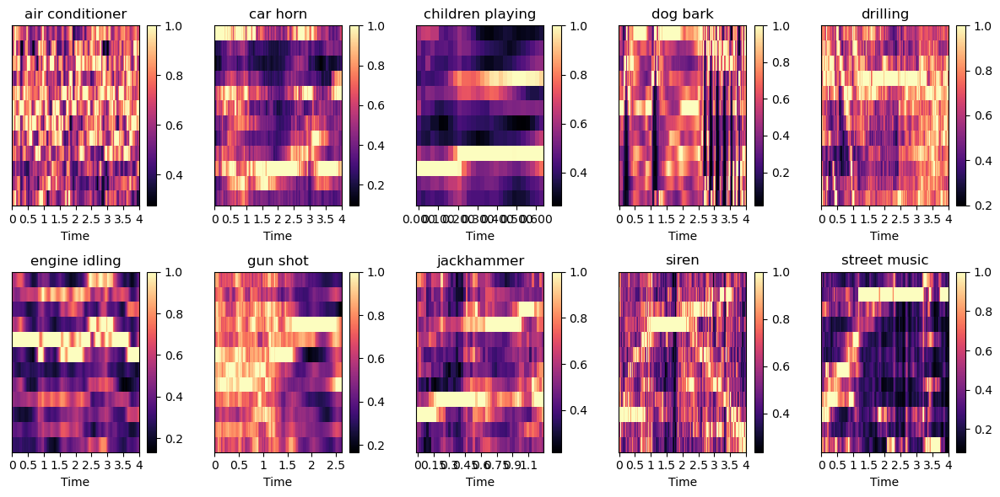

In [42]:
plot_chromagram_cqt(sound_names,raw_sounds)

In [43]:
def plot_chromagram_cens(sound_names, raw_sounds):
    plt.figure(figsize=(12, 6))
    for i, sound in enumerate(raw_sounds):
        chromagram = librosa.feature.chroma_cens(y=sound, sr=sample_rate)
        plt.subplot(2, len(raw_sounds) // 2, i + 1)
        plt.title(sound_names[i])
        plt.xlabel('Time')
        plt.ylabel('Chromagram (CENS)')
        librosa.display.specshow(chromagram, x_axis='time')
        plt.colorbar()
    plt.tight_layout()
    plt.show()

c:\Users\ishaa\anaconda\Lib\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=1024 is too large for input signal of length=896
  warnings.warn(
c:\Users\ishaa\anaconda\Lib\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=1024 is too large for input signal of length=448
  warnings.warn(
c:\Users\ishaa\anaconda\Lib\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=1024 is too large for input signal of length=224
  warnings.warn(
c:\Users\ishaa\anaconda\Lib\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=1024 is too large for input signal of length=900
  warnings.warn(
c:\Users\ishaa\anaconda\Lib\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=1024 is too large for input signal of length=820
  warnings.warn(
c:\Users\ishaa\anaconda\Lib\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=1024 is too large for input signal of length=410
  warnings.warn(


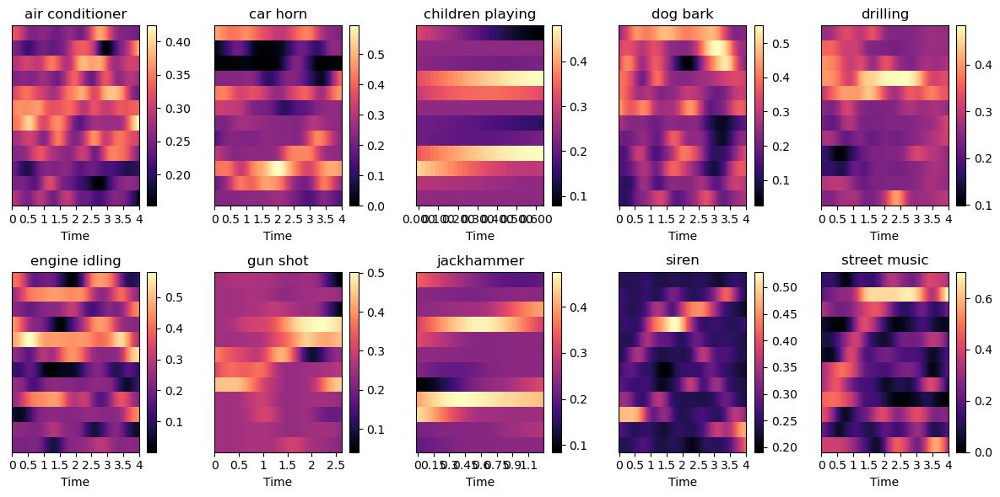

In [44]:
plot_chromagram_cens(sound_names,raw_sounds)

Spectral features

1.spectral rolloff

Text(0.5, 14.722222222222216, 'dog bark')

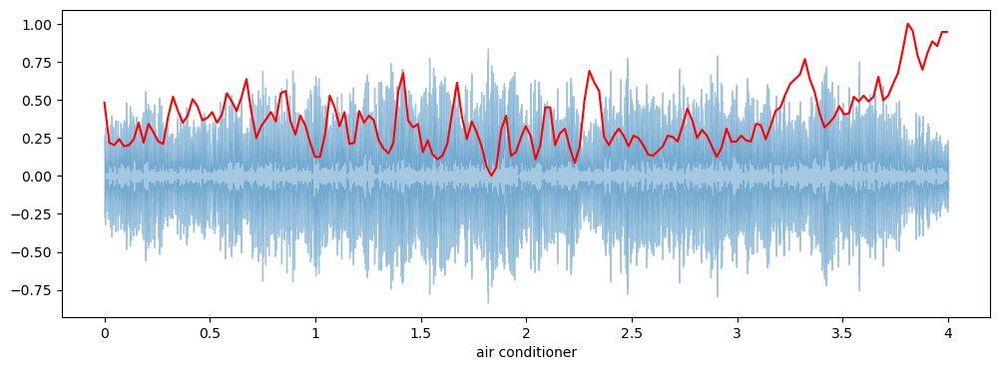

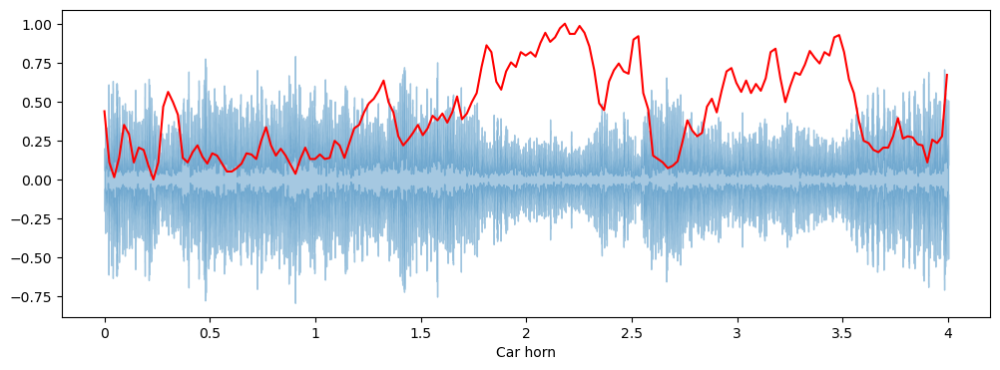

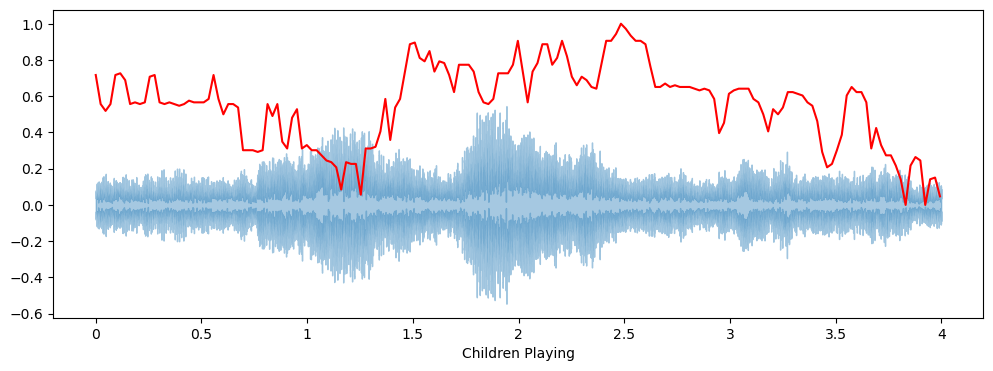

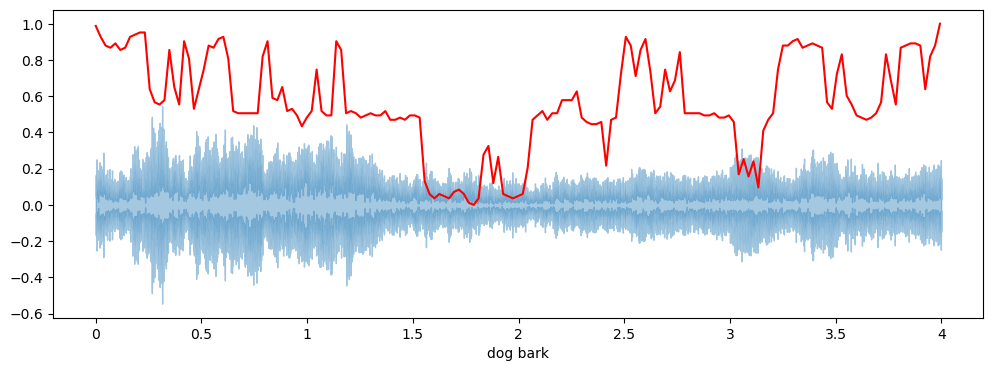

In [50]:
import sklearn
from sklearn.preprocessing import minmax_scale
X1,sr = librosa.load('C:/Users/ishaa/OneDrive/Desktop/dataset/Audio/fold1/22962-4-0-1.wav')
X2,sr = librosa.load('C:/Users/ishaa/OneDrive/Desktop/dataset/Audio/fold1/22962-4-0-2.wav') 
X3,sr = librosa.load('C:/Users/ishaa/OneDrive/Desktop/dataset/Audio/fold1/24074-1-0-2.wav')
X4,sr = librosa.load('C:/Users/ishaa/OneDrive/Desktop/dataset/Audio/fold1/24074-1-0-9.wav')

spectral_rolloff1 = librosa.feature.spectral_rolloff(y=X1, sr=sr)[0]
frames1 = range(len(spectral_rolloff1))
t1 = librosa.frames_to_time(frames1)
def normalize(X1, axis=0):
    return sklearn.preprocessing.minmax_scale(X1, axis=axis)
plt.figure(figsize=(12, 4))
librosa.display.waveshow(X1, sr=sr, alpha=0.4)
plt.plot(t1, normalize(spectral_rolloff1), color='r')
plt.xlabel("air conditioner")

spectral_rolloff2 = librosa.feature.spectral_rolloff(y=X2, sr=sr)[0]
frames2 = range(len(spectral_rolloff2))
t2 = librosa.frames_to_time(frames2)
plt.figure(figsize=(12, 4))
def normalize(X2, axis=0):
    return sklearn.preprocessing.minmax_scale(X2, axis=axis)
librosa.display.waveshow(X2, sr=sr, alpha=0.4)
plt.plot(t2, normalize(spectral_rolloff2), color='r')
plt.xlabel("Car horn")

spectral_rolloff3 = librosa.feature.spectral_rolloff(y=X3, sr=sr)[0]
frames3 = range(len(spectral_rolloff3))
t3 = librosa.frames_to_time(frames3)
plt.figure(figsize=(12, 4))
def normalize(X3, axis=0):
    return sklearn.preprocessing.minmax_scale(X3, axis=axis)
librosa.display.waveshow(X3, sr=sr, alpha=0.4)
plt.plot(t3, normalize(spectral_rolloff3), color='r')
plt.xlabel("Children Playing")

spectral_rolloff4 = librosa.feature.spectral_rolloff(y=X4, sr=sr)[0]
frames4 = range(len(spectral_rolloff4))
t4 = librosa.frames_to_time(frames4)
plt.figure(figsize=(12, 4))
def normalize(X4, axis=0):
    return sklearn.preprocessing.minmax_scale(X4, axis=axis)
librosa.display.waveshow(X4, sr=sr, alpha=0.4)
plt.plot(t4, normalize(spectral_rolloff4), color='r')
plt.xlabel("dog bark")


2. Spectral Centroid

Text(0.5, 14.722222222222216, 'dog bark')

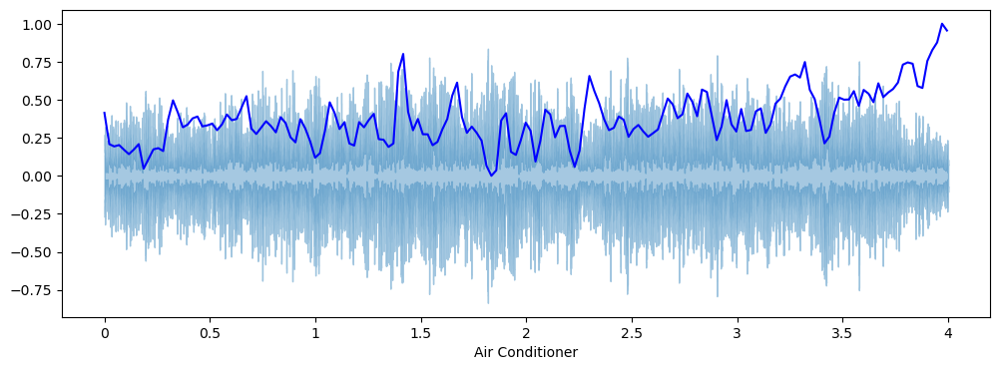

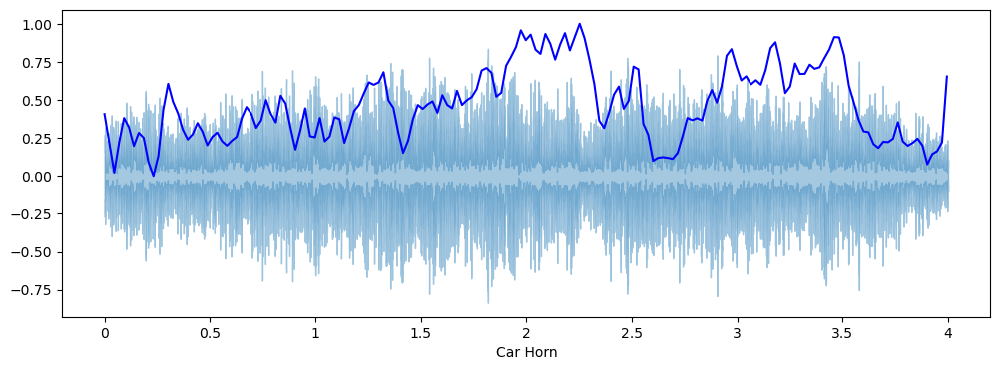

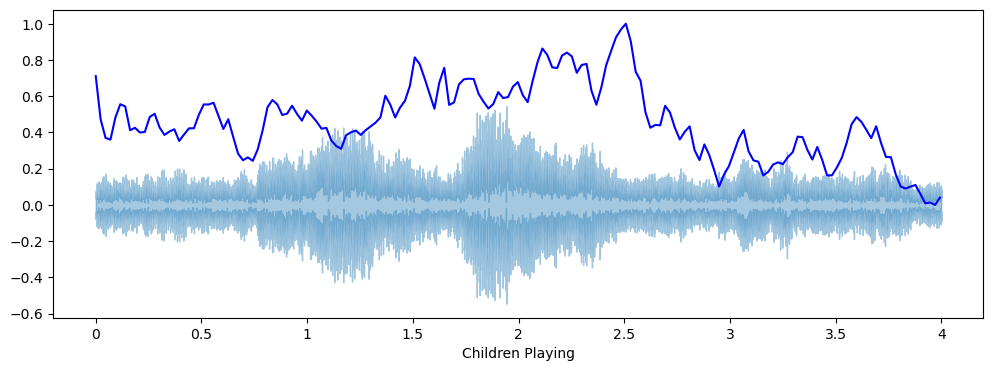

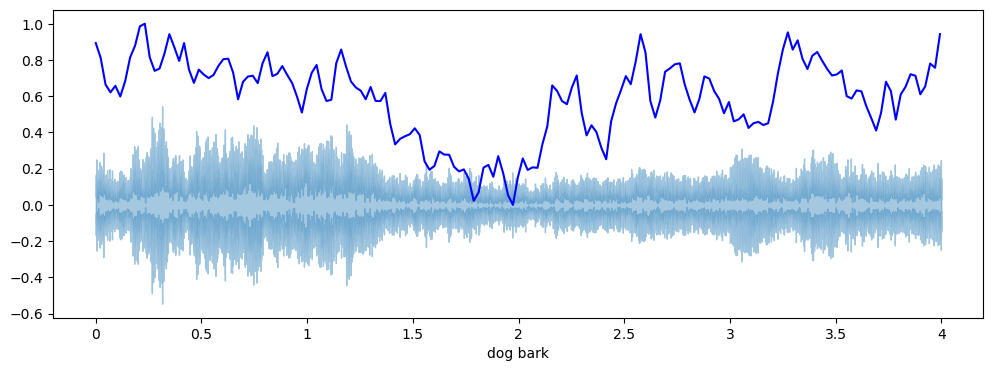

In [53]:
import sklearn
X1,sr = librosa.load('C:/Users/ishaa/OneDrive/Desktop/dataset/Audio/fold1/22962-4-0-1.wav')
X2,sr = librosa.load('C:/Users/ishaa/OneDrive/Desktop/dataset/Audio/fold1/22962-4-0-2.wav') 
X3,sr = librosa.load('C:/Users/ishaa/OneDrive/Desktop/dataset/Audio/fold1/24074-1-0-2.wav')
X4,sr = librosa.load('C:/Users/ishaa/OneDrive/Desktop/dataset/Audio/fold1/24074-1-0-9.wav')

spectral_centroid1 = librosa.feature.spectral_centroid(y=X1, sr=sr)[0]
frames1 = range(len(spectral_centroid1))
t1 = librosa.frames_to_time(frames1)
def normalize(X1, axis=0):
    
    return sklearn.preprocessing.minmax_scale(X1, axis=axis)
plt.figure(figsize=(12, 4))
librosa.display.waveshow(X1, sr=sr, alpha=0.4)
plt.plot(t1, normalize(spectral_centroid1), color='b')
plt.xlabel("Air Conditioner")


spectral_centroid2 = librosa.feature.spectral_centroid(y=X2, sr=sr)[0]
frames2 = range(len(spectral_centroid2))
t2 = librosa.frames_to_time(frames2)
def normalize(X2, axis=0):
    
    return sklearn.preprocessing.minmax_scale(X2, axis=axis)
plt.figure(figsize=(12, 4))
librosa.display.waveshow(X1, sr=sr, alpha=0.4)
plt.plot(t2, normalize(spectral_centroid2), color='b')
plt.xlabel("Car Horn")

spectral_centroid3 = librosa.feature.spectral_centroid(y=X3, sr=sr)[0]
frames3 = range(len(spectral_centroid3))
t3 = librosa.frames_to_time(frames3)
def normalize(X3, axis=0):
    
    return sklearn.preprocessing.minmax_scale(X3, axis=axis)
plt.figure(figsize=(12, 4))
librosa.display.waveshow(X3, sr=sr, alpha=0.4)
plt.plot(t3, normalize(spectral_centroid3), color='b')
plt.xlabel("Children Playing")

spectral_centroid4 = librosa.feature.spectral_centroid(y=X4, sr=sr)[0]
frames4 = range(len(spectral_centroid4))
t4 = librosa.frames_to_time(frames4)
def normalize(X4, axis=0):
    
    return sklearn.preprocessing.minmax_scale(X4, axis=axis)
plt.figure(figsize=(12, 4))
librosa.display.waveshow(X4, sr=sr, alpha=0.4)
plt.plot(t4, normalize(spectral_centroid4), color='b')
plt.xlabel("dog bark")


Zero Crossing Rate

zc of air conditioner audio is 5
zc of Car Horn audio is 4
zc of children playing audio is 11
zc of dog bark audio is 15


<Figure size 1400x500 with 0 Axes>

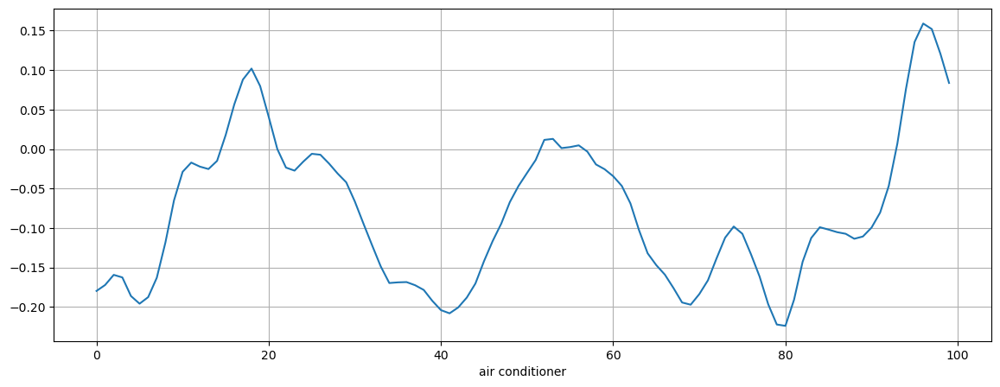

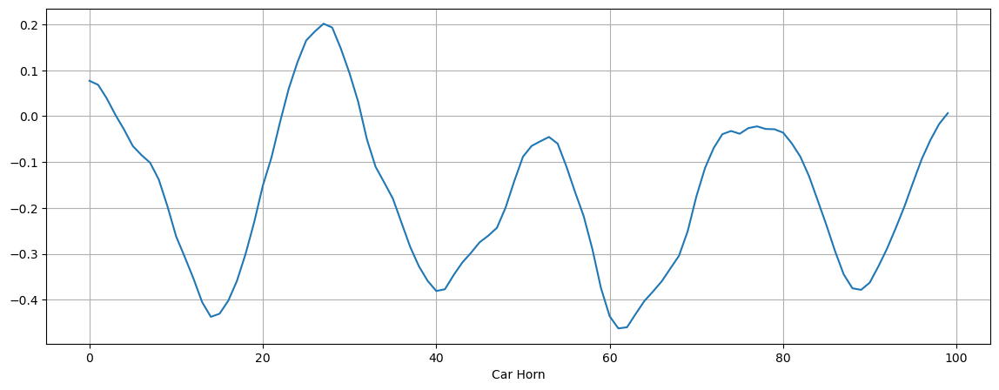

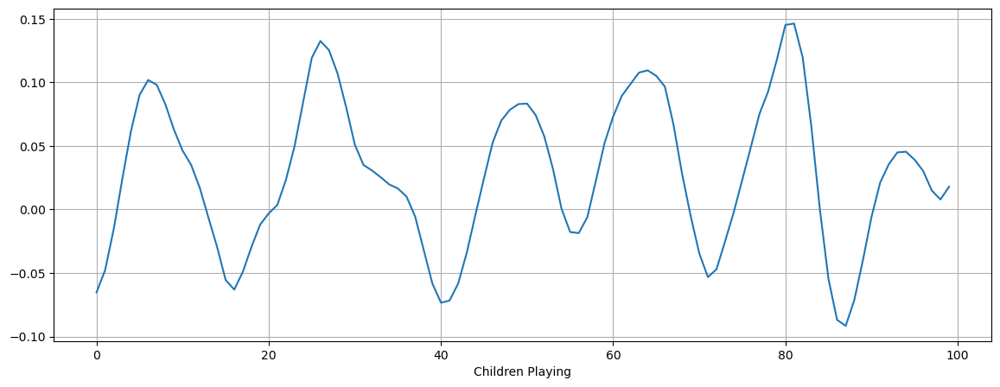

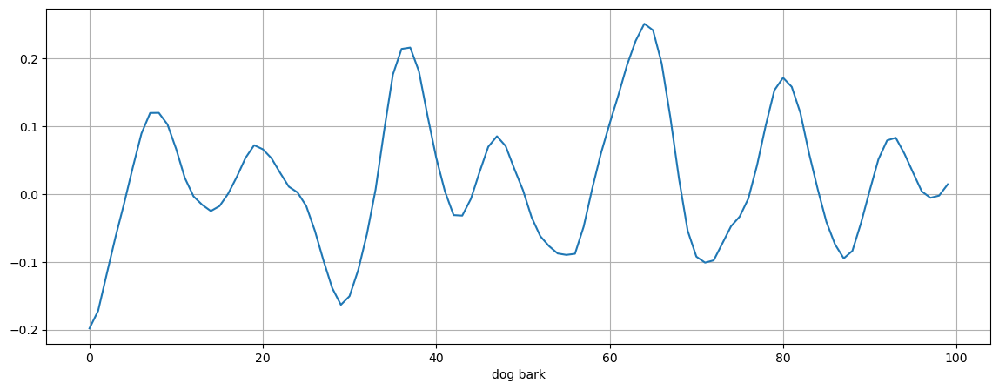

In [54]:
import sklearn
X1,sr = librosa.load('C:/Users/ishaa/OneDrive/Desktop/dataset/Audio/fold1/22962-4-0-1.wav')
X2,sr = librosa.load('C:/Users/ishaa/OneDrive/Desktop/dataset/Audio/fold1/22962-4-0-2.wav') 
X3,sr = librosa.load('C:/Users/ishaa/OneDrive/Desktop/dataset/Audio/fold1/24074-1-0-2.wav')
X4,sr = librosa.load('C:/Users/ishaa/OneDrive/Desktop/dataset/Audio/fold1/24074-1-0-9.wav')

plt.figure(figsize=(14, 5))
# Zooming in
n0 = 9000
n1 = 9100
plt.figure(figsize=(14, 5))
plt.plot(X1[n0:n1])
plt.xlabel("air conditioner")
plt.grid()

zero_crossings1 = librosa.zero_crossings(y=X1[n0:n1], pad=False)
print("zc of air conditioner audio is", sum(zero_crossings1))

plt.figure(figsize=(14, 5))
plt.plot(X2[n0:n1])
plt.xlabel("Car Horn")
plt.grid()
zero_crossings2 = librosa.zero_crossings(y=X2[n0:n1], pad=False)
print("zc of Car Horn audio is", sum(zero_crossings2))

plt.figure(figsize=(14, 5))
plt.plot(X3[n0:n1])
plt.xlabel("Children Playing")
plt.grid()
zero_crossings3 = librosa.zero_crossings(y=X3[n0:n1], pad=False)
print("zc of children playing audio is", sum(zero_crossings3))

plt.figure(figsize=(14, 5))
plt.plot(X4[n0:n1])
plt.xlabel("dog bark")
plt.grid()
zero_crossings4 = librosa.zero_crossings(y=X4[n0:n1], pad=False)
print("zc of dog bark audio is", sum(zero_crossings4))


Root Mean Square

Text(0.5, 1.0, 'dog bark')

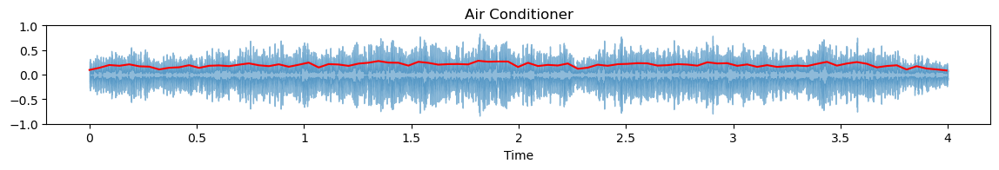

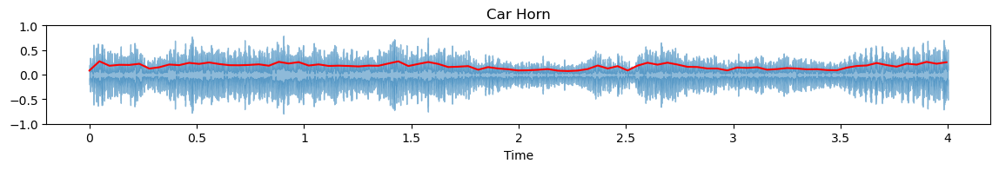

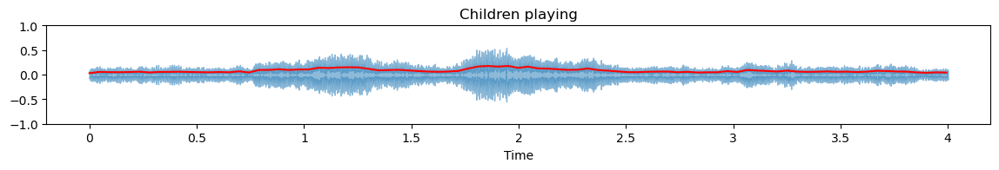

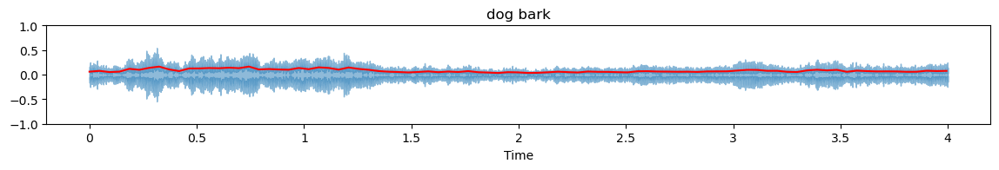

In [55]:
import sklearn
X1,sr = librosa.load('C:/Users/ishaa/OneDrive/Desktop/dataset/Audio/fold1/22962-4-0-1.wav')
X2,sr = librosa.load('C:/Users/ishaa/OneDrive/Desktop/dataset/Audio/fold1/22962-4-0-2.wav') 
X3,sr = librosa.load('C:/Users/ishaa/OneDrive/Desktop/dataset/Audio/fold1/24074-1-0-2.wav')
X4,sr = librosa.load('C:/Users/ishaa/OneDrive/Desktop/dataset/Audio/fold1/24074-1-0-9.wav')

HOP_LENGTH=1024
FRAME_SIZE=512
rms1 = librosa.feature.rms(y=X1,frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
frames1 = range(len(rms1))
t1 = librosa.frames_to_time(frames1,hop_length=HOP_LENGTH)
plt.figure(figsize=(14, 5))
ax = plt.subplot(3, 1, 1)
librosa.display.waveshow(X1, alpha=0.5)
plt.plot(t1,rms1, color='r')
plt.ylim((-1, 1))
plt.title("Air Conditioner")

rms2 = librosa.feature.rms(y=X2,frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
frames2 = range(len(rms2))
t2 = librosa.frames_to_time(frames2,hop_length=HOP_LENGTH)
plt.figure(figsize=(14, 5))
ax = plt.subplot(3, 1, 1)
librosa.display.waveshow(X2, alpha=0.5)
plt.plot(t2,rms2, color='r')
plt.ylim((-1, 1))
plt.title("Car Horn")

rms3 = librosa.feature.rms(y=X3,frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
frames3 = range(len(rms3))
t3 = librosa.frames_to_time(frames3,hop_length=HOP_LENGTH)
plt.figure(figsize=(14, 5))
ax = plt.subplot(3, 1, 1)
librosa.display.waveshow(X3, alpha=0.5)
plt.plot(t3,rms3, color='r')
plt.ylim((-1, 1))
plt.title("Children playing")

rms4 = librosa.feature.rms(y=X4,frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
frames4 = range(len(rms4))
t4 = librosa.frames_to_time(frames4,hop_length=HOP_LENGTH)
plt.figure(figsize=(14, 5))
ax = plt.subplot(3, 1, 1)
librosa.display.waveshow(X4, alpha=0.5)
plt.plot(t4,rms4, color='r')
plt.ylim((-1, 1))
plt.title("dog bark")


5. Spectral Bandwidth

In [57]:
## Loading data for Spectral_Bandwith
x1, sr = librosa.load(df)
x2, sr = librosa.load(df1)
x3, sr = librosa.load(df2)

Text(0.5, 14.722222222222216, 'Drilling')

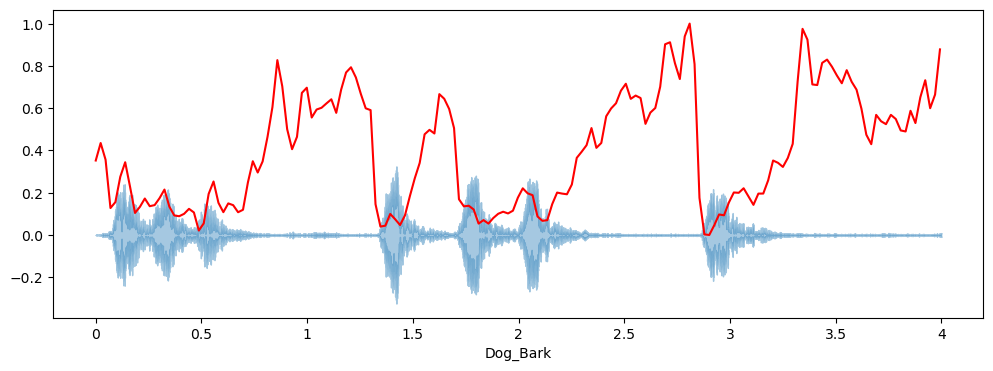

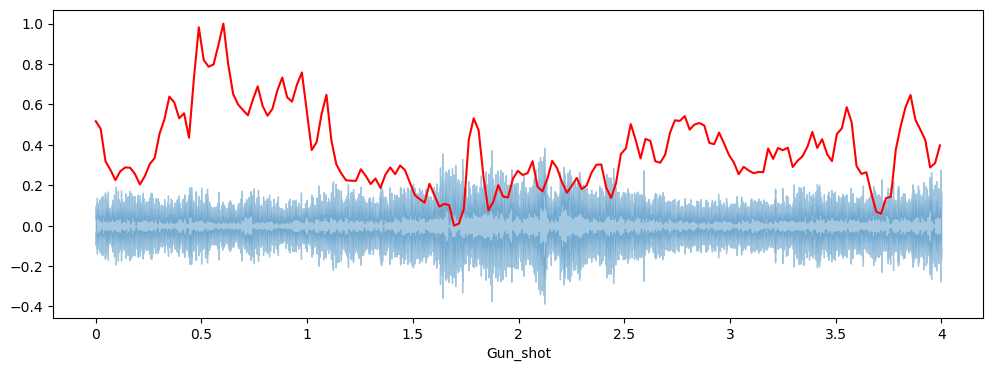

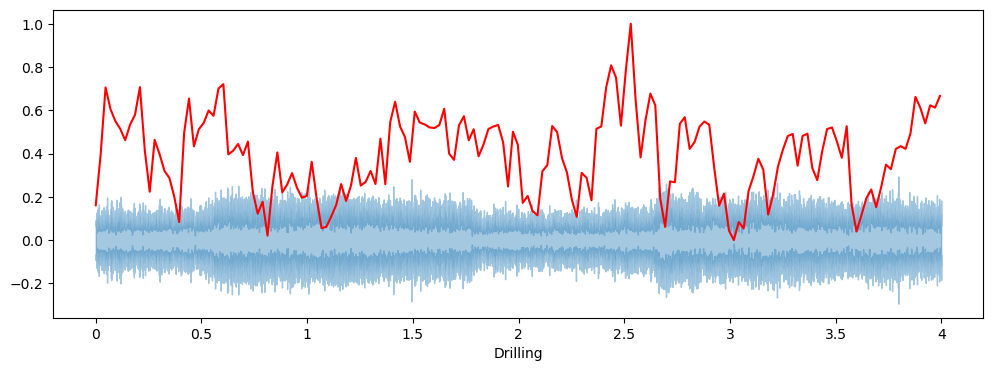

In [58]:
spectral_bandwith1 = librosa.feature.spectral_bandwidth(y=x1, sr=sr)[0]
frames1 = range(len(spectral_bandwith1))
t1 = librosa.frames_to_time(frames1)
def normalize(x1, axis=0):
    return sklearn.preprocessing.minmax_scale(x1, axis=axis)

plt.figure(figsize=(12, 4))
librosa.display.waveshow(x1, sr=sr, alpha=0.4)
plt.plot(t1, normalize(spectral_bandwith1), color='r')
plt.xlabel("Dog_Bark")

spectral_bandwith2 = librosa.feature.spectral_bandwidth(y=x2, sr=sr)[0]
frames2 = range(len(spectral_bandwith2))
t2 = librosa.frames_to_time(frames2)
def normalize(x2, axis=0):
    return sklearn.preprocessing.minmax_scale(x2, axis=axis)

plt.figure(figsize=(12, 4))
librosa.display.waveshow(x2, sr=sr, alpha=0.4)
plt.plot(t2, normalize(spectral_bandwith2), color='r')
plt.xlabel("Gun_shot")

spectral_bandwith3 = librosa.feature.spectral_bandwidth(y=x3, sr=sr)[0]
frames3 = range(len(spectral_bandwith3))
t3 = librosa.frames_to_time(frames3)
def normalize(x3, axis=0):
    return sklearn.preprocessing.minmax_scale(x3, axis=axis)

plt.figure(figsize=(12, 4))
librosa.display.waveshow(x3, sr=sr, alpha=0.4)
plt.plot(t3, normalize(spectral_bandwith3), color='r')
plt.xlabel("Drilling")